# **New York City Uber Time Series Analysis and Ride Demand Prediction**

**Authors:**

Koelgeet Kaur

Suman Senapati

Dr. Sanjay Kumar

Based on the dataset (source: https://github.com/fivethirtyeight/uber-tlc-foil-response) we are working on the following objective for this notebook:

**Ride Demand Prediction**

--- **Goal**: Predict the number of Uber pickups at a given time and location.

--- **Input Features:**
Date & Time (hour, day, month, weekday/weekend)
Location (Latitude & Longitude or Zone ID)

--- **Output:** Expected number of Uber pickups.

--- **Models:**

1. **Time Series Models:** ARIMA, SARIMA

2. **Machine Learning Models:** XGBoost, Random Forest, LSTM (Deep Learning)

Use Case: Helps Uber optimize driver deployment and dynamic pricing.


**Introduction**

This analysis utilizes data on over 4.5 million Uber pickups in New York City from April to September 2014. The data is organized into six files, separated by month, and includes the following columns:

**Date/Time:** The date and time of the Uber pickup

**Lat:** The latitude of the Uber pickup

**Lon:** The longitude of the Uber pickup

**Base:** The TLC base company code affiliated with the Uber pickup

As we do not have access to revenue or fee per trip information, our analysis will focus on analyzing user patterns in date and time to gain insights.

# **1. Importing Libraries**

In [58]:
import pandas as pd
import numpy as np
import glob
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import plotly.express as px
from shapely.geometry import Point
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import joblib
from tensorflow.keras.models import load_model
import tensorflow.keras.losses
import datetime
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import StandardScaler


# **2. Importing dataset**

In [2]:
# Kaggle dataset paths
data_apr = pd.read_csv('/kaggle/input/uber-nyc-2014/uber-raw-data-apr14.csv')
data_may = pd.read_csv('/kaggle/input/uber-nyc-2014/uber-raw-data-may14.csv')
data_jun = pd.read_csv('/kaggle/input/uber-nyc-2014/uber-raw-data-jun14.csv')
data_jul = pd.read_csv('/kaggle/input/uber-nyc-2014/uber-raw-data-jul14.csv')
data_aug = pd.read_csv('/kaggle/input/uber-nyc-2014/uber-raw-data-aug14.csv')
data_sep = pd.read_csv('/kaggle/input/uber-nyc-2014/uber-raw-data-sep14.csv')

uber_data = pd.concat([data_apr,data_may,data_jun, data_jul,data_aug,data_sep])

# **3. Data Pre-processing**

In [3]:
uber_data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [4]:
# Convert Date/Time column to datetime
uber_data.rename(columns={'Date/Time': 'datetime'}, inplace=True)
uber_data['datetime'] = pd.to_datetime(uber_data['datetime'])

uber_data.head()

,datetime,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [5]:
uber_data.isna().sum().sum()

0

In [ ]:
uber_location=uber_data.copy()
uber_location.head()

,datetime,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


# **4. Exploratory Data Analysis**

**4.1 Analyzing the data for each month from April to September 2014**

**4.1.0 Preliminary steps**

In [6]:
##------Renaming the Date/Time column to datetime and changing its data type to datetime for individual month-----##

data_apr.rename(columns={'Date/Time': 'datetime'}, inplace=True)
data_apr['datetime'] = pd.to_datetime(data_apr['datetime'])

data_may.rename(columns={'Date/Time': 'datetime'}, inplace=True)
data_may['datetime'] = pd.to_datetime(data_may['datetime'])

data_jun.rename(columns={'Date/Time': 'datetime'}, inplace=True)
data_jun['datetime'] = pd.to_datetime(data_jun['datetime'])

data_jul.rename(columns={'Date/Time': 'datetime'}, inplace=True)
data_jul['datetime'] = pd.to_datetime(data_jul['datetime'])

data_aug.rename(columns={'Date/Time': 'datetime'}, inplace=True)
data_aug['datetime'] = pd.to_datetime(data_aug['datetime'])

data_sep.rename(columns={'Date/Time': 'datetime'}, inplace=True)
data_sep['datetime'] = pd.to_datetime(data_sep['datetime'])


In [7]:
##----Adding three new columns of Date, Hour and day of the week-----##

# For the month of April
data_apr['Date'] = data_apr['datetime'].dt.date
data_apr['Hour'] = data_apr['datetime'].dt.hour
data_apr['Day_of_Week'] = data_apr['datetime'].dt.day_name()

# For the month of May
data_may['Date'] = data_may['datetime'].dt.date
data_may['Hour'] = data_may['datetime'].dt.hour
data_may['Day_of_Week'] = data_may['datetime'].dt.day_name()

# For the month of June
data_jun['Date'] = data_jun['datetime'].dt.date
data_jun['Hour'] = data_jun['datetime'].dt.hour
data_jun['Day_of_Week'] = data_jun['datetime'].dt.day_name()

# For the month of July
data_jul['Date'] = data_jul['datetime'].dt.date
data_jul['Hour'] = data_jul['datetime'].dt.hour
data_jul['Day_of_Week'] = data_jul['datetime'].dt.day_name()

# For the month of August
data_aug['Date'] = data_aug['datetime'].dt.date
data_aug['Hour'] = data_aug['datetime'].dt.hour
data_aug['Day_of_Week'] = data_aug['datetime'].dt.day_name()

# For the month of September
data_sep['Date'] = data_sep['datetime'].dt.date
data_sep['Hour'] = data_sep['datetime'].dt.hour
data_sep['Day_of_Week'] = data_sep['datetime'].dt.day_name()

In [8]:
##----Calculating the ride demands based on Dates, Hours and Days of the week-----##

# For the month of April
date_counts_apr = data_apr['Date'].value_counts().sort_index()
hour_counts_apr = data_apr['Hour'].value_counts().sort_index()
day_counts_apr = data_apr['Day_of_Week'].value_counts()

# For the month of May
date_counts_may = data_may['Date'].value_counts().sort_index()
hour_counts_may = data_may['Hour'].value_counts().sort_index()
day_counts_may = data_may['Day_of_Week'].value_counts()

# For the month of June
date_counts_jun = data_jun['Date'].value_counts().sort_index()
hour_counts_jun = data_jun['Hour'].value_counts().sort_index()
day_counts_jun = data_jun['Day_of_Week'].value_counts()

# For the month of July
date_counts_jul = data_jul['Date'].value_counts().sort_index()
hour_counts_jul = data_jul['Hour'].value_counts().sort_index()
day_counts_jul = data_jul['Day_of_Week'].value_counts()

# For the month of August
date_counts_aug = data_aug['Date'].value_counts().sort_index()
hour_counts_aug = data_aug['Hour'].value_counts().sort_index()
day_counts_aug = data_aug['Day_of_Week'].value_counts()

# For the month of September
date_counts_sep = data_sep['Date'].value_counts().sort_index()
hour_counts_sep = data_sep['Hour'].value_counts().sort_index()
day_counts_sep = data_sep['Day_of_Week'].value_counts()

In [ ]:
# Add a new column called 'Daytime':

def hour_to_daytime(Hour):
    if Hour>= 5 and Hour< 11:
        return 'Morning'
    elif Hour>= 11 and Hour< 17:
        return 'Afternoon'
    elif Hour>= 17 and Hour< 23:
        return 'Evening'
    else:
        return 'Midnight'

data_apr['Daytime']= data_apr['Hour'].apply(hour_to_daytime)
data_may['Daytime']= data_may['Hour'].apply(hour_to_daytime)
data_jun['Daytime']= data_jun['Hour'].apply(hour_to_daytime)
data_jul['Daytime']= data_jul['Hour'].apply(hour_to_daytime)
data_aug['Daytime']= data_aug['Hour'].apply(hour_to_daytime)
data_sep['Daytime']= data_sep['Hour'].apply(hour_to_daytime)

**4.1.1 Distribution of Ride Demands by Dates**

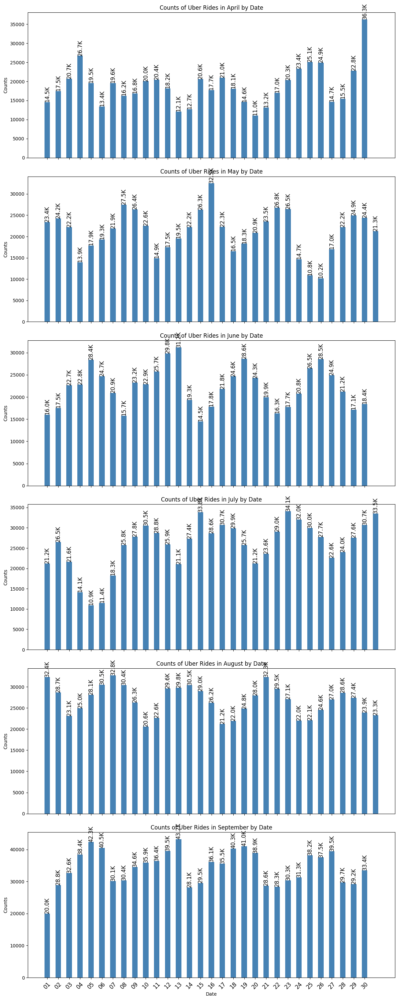

In [9]:

# Creating a subplot with 6 rows and 1 column
fig, axes = plt.subplots(nrows=6, ncols=1,figsize=(12,30), sharex=True)

# Months from April to September and their corresponding data
months = ["April", "May", "June", "July", "August", "September"]
date_counts = {
    "April": date_counts_apr,
    "May": date_counts_may,
    "June": date_counts_jun,
    "July": date_counts_jul,
    "August": date_counts_aug,
    "September": date_counts_sep
}

for i, month in enumerate(months):
    ax = axes[i]
    data = date_counts[month]

    # Convert dates to categorical x positions
    x_positions = np.arange(len(data))  # Evenly spaced categorical indices

    # Plot bar chart with reduced width and uniform spacing
    ax.bar(x_positions, data.values, color='steelblue', width=0.5)
    ax.set_ylabel('Counts')
    ax.set_title(f'Counts of Uber Rides in {month} by Date')

    # Reduce the number of x-axis ticks (show every 3rd or 4th date)
    step = 1  # Adjust step size for better spacing
    tick_positions = np.arange(0, len(data), step=step)
    tick_labels = [data.index[j].strftime('%d') for j in tick_positions]

    ax.set_xticks(tick_positions)
    ax.set_xticklabels(tick_labels, rotation=45, fontsize=12)

    # Add annotations on y-axis
    for j in range(len(data)):
        ax.text(x_positions[j], data.values[j], f"{data.values[j]/1000:.1f}K",
                rotation=90, ha='center', va='bottom', fontsize=12)

# Shared x-label
axes[-1].set_xlabel('Date')

plt.tight_layout()
plt.show()


**Observation from the above distribution**


**4.1.2 Distribution of Ride Demands by Days of the Week**

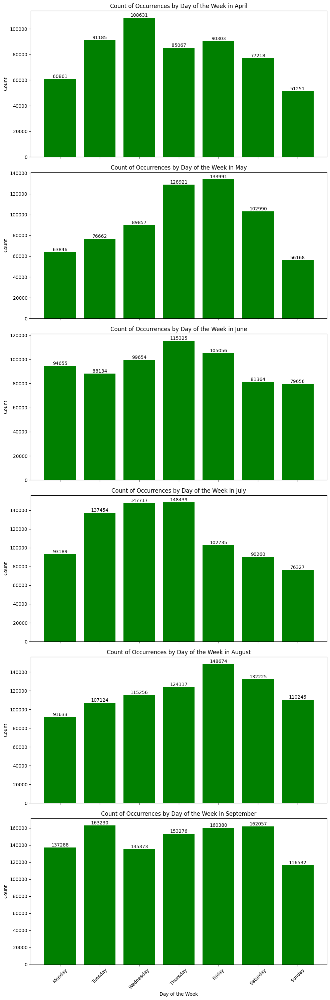

In [10]:
# Define the correct order of days
days_label = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Reorder day_counts for each month and fill missing values with 0
day_counts_apr = data_apr['Day_of_Week'].value_counts().reindex(days_label)
day_counts_may = data_may['Day_of_Week'].value_counts().reindex(days_label)
day_counts_jun = data_jun['Day_of_Week'].value_counts().reindex(days_label)
day_counts_jul = data_jul['Day_of_Week'].value_counts().reindex(days_label)
day_counts_aug = data_aug['Day_of_Week'].value_counts().reindex(days_label)
day_counts_sep = data_sep['Day_of_Week'].value_counts().reindex(days_label)

fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(10, 30), sharex=True)

# Dictionary with data for each month
months = ["April", "May", "June", "July", "August", "September"]
day_counts_dict = {
    "April": day_counts_apr,
    "May": day_counts_may,
    "June": day_counts_jun,
    "July": day_counts_jul,
    "August": day_counts_aug,
    "September": day_counts_sep
}

for i, month in enumerate(months):
    ax = axes[i]
    day_counts = day_counts_dict[month]  # Get data for the month

    ax.bar(day_counts.index, day_counts.values, color='green')
    ax.set_ylabel('Count')
    ax.set_title(f'Count of Occurrences by Day of the Week in {month}')

    # Reset x-axis labels
    ax.set_xticks(range(len(days_label)))
    ax.set_xticklabels(days_label, rotation=45)

    # Add annotations on y-axis
    for j, value in enumerate(day_counts.values):
        ax.text(j, value, str(value), ha='center', va='bottom')

# Shared x-label
axes[-1].set_xlabel('Day of the Week')

plt.tight_layout()
plt.show()

**Observation from the above distribution**

**4.1.3 Distribution of Ride Demands by Hours**

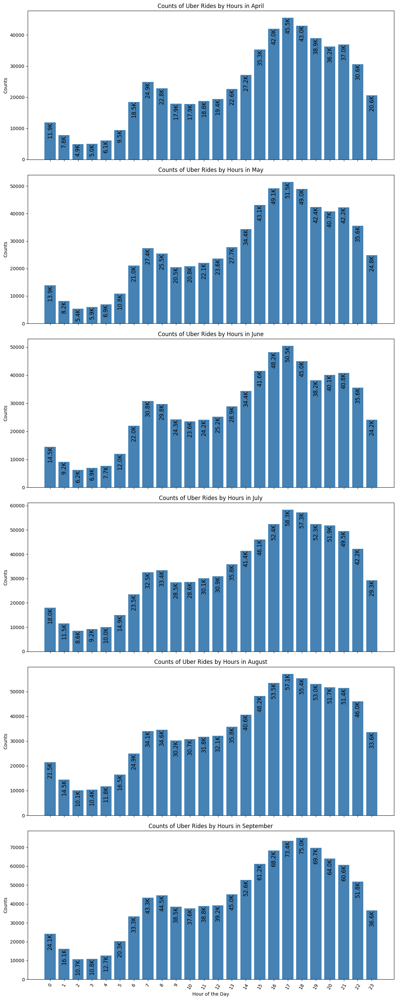

In [11]:


# Creating a subplot with 6 rows and 1 column
fig, axes = plt.subplots(nrows=6, ncols=1, figsize=(12, 30), sharex=True)

# Dictionary with data for each month
months = ["April", "May", "June", "July", "August", "September"]
hour_counts_dict = {
    "April": data_apr['Hour'].value_counts().sort_index(),
    "May": data_may['Hour'].value_counts().sort_index(),
    "June": data_jun['Hour'].value_counts().sort_index(),
    "July": data_jul['Hour'].value_counts().sort_index(),
    "August": data_aug['Hour'].value_counts().sort_index(),
    "September": data_sep['Hour'].value_counts().sort_index()
}

for i, month in enumerate(months):
    ax = axes[i]
    hour_counts = hour_counts_dict[month]

    # Plot bar chart
    ax.bar(hour_counts.index, hour_counts.values, color='steelblue')
    ax.set_ylabel('Counts')
    ax.set_title(f'Counts of Uber Rides by Hours in {month}')

    # Set x-ticks for hours (0-23)
    ax.set_xticks(hour_counts.index)
    ax.set_xticklabels(hour_counts.index, rotation=60)

    # Add annotations on y-axis
    for j in range(len(hour_counts)):
        ax.text(hour_counts.index[j], hour_counts.values[j], f"{hour_counts.values[j]/1000:.1f}K",
                rotation=90, ha='center', va='top', fontsize=12)

# Shared x-label
axes[-1].set_xlabel('Hour of the Day')

plt.tight_layout()
plt.show()


**4.2 Analyzing the entire dataset from April to September 2014**

**4.2.0 Preliminary Steps**

In [12]:
##----Adding three new columns of Date,Hour and Day of the week----##

uber_data['Date'] = uber_data['datetime'].dt.date
uber_data['Hour'] = uber_data['datetime'].dt.hour
uber_data['Day_of_Week']= uber_data['datetime'].dt.day_name()
uber_data['Month'] = uber_data['datetime'].dt.month

uber_data.head()

,datetime,Lat,Lon,Base,Date,Hour,Day_of_Week,Month
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,2014-04-01,0,Tuesday,4
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,2014-04-01,0,Tuesday,4
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,2014-04-01,0,Tuesday,4
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,2014-04-01,0,Tuesday,4
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,2014-04-01,0,Tuesday,4


In [13]:
# Calculate counts of occurrences of Dates and Hours:
date_counts_uber = uber_data['Date'].value_counts().sort_index()

**4.2.1 Temporal Distribution of Ride demands using Line Plot**

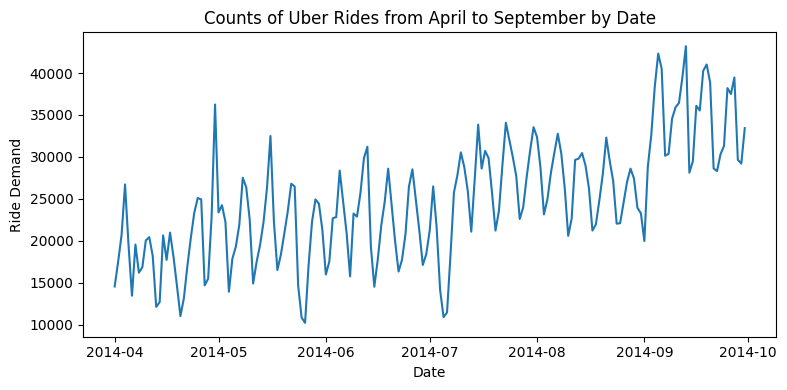

In [14]:
# Create a line plot of Dates:
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(date_counts_uber.index, date_counts_uber.values)
ax.set_xlabel('Date')
ax.set_ylabel('Ride Demand')
ax.set_title('Counts of Uber Rides from April to September by Date')

plt.tight_layout()
plt.show()

**Observation from the above distribution**

**4.2.2 Cross Validating using Heatmaps**

In [15]:
def count_rows(rows):
    return len(rows)

def heatmap(col1,col2):
    by_cross=uber_data.groupby([col1,col2]).apply(count_rows)
    pivot=by_cross.unstack()
    plt.figure(figsize=(20,15));
    return px.imshow(pivot,
          labels=dict(color="Number Of Trips"),
          title=' Heatmap by {} and {}'.format(col1,col2)
         )

**4.2.2.1 Hourly Trip Distribution Across Months**

In [16]:
heatmap('Month','Hour')

<ipython-input-15-f731f7429263>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  by_cross=uber_data.groupby([col1,col2]).apply(count_rows)


<Figure size 2000x1500 with 0 Axes>

**Observation from the above distribution**

**4.2.2.2 Hourly Trip Distribution Across Days of the Week**

In [17]:
heatmap('Day_of_Week','Hour')

<ipython-input-15-f731f7429263>:5: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



<Figure size 2000x1500 with 0 Axes>

**Observation from the above distribution**

**4.2.2.3 Hourly Trip Distribution Across different Dates**

In [18]:
heatmap('Date','Hour')

<ipython-input-15-f731f7429263>:5: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



<Figure size 2000x1500 with 0 Axes>

**Observation from the above distribution**

**4.3 Analyzing the entire dataset by Location**

**4.3.0 Preliminary step**

In [19]:
##-----Aggregate ride demand per hour-----##

total_demand = uber_data.groupby(["Lat", "Lon"]).size().reset_index(name="trip_count")

# Initialize a Folium map centered on NYC
#m = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Prepare heatmap data (lat, lon, ride count)
heat_data = list(zip(total_demand["Lat"], total_demand["Lon"], total_demand["trip_count"]))

# Add heatmap layer
#HeatMap(heat_data, radius=15, blur=10).add_to(m)

# Save & display the map
#m.save("uber_hourly_heatmap.html")
#m

In [20]:
# Load NYC Taxi Zones shapefile (if available)
nyc_zones = gpd.read_file("/kaggle/input/taxi-zone-shape-files")


In [21]:
nyc_zones = nyc_zones.to_crs(epsg=4326)

**4.3.0.1 Identifying the top 3 locations with the highest ride demand**

In [22]:
# Aggregate ride demand per location
top_locations = uber_data.groupby(["Lat", "Lon"]).size().reset_index(name="trip_count")

# Get the top 3 locations with the highest demand
top_3 = top_locations.sort_values(by="trip_count", ascending=False).head(3)
print(top_3)

            Lat      Lon  trip_count
32881   40.6448 -73.7819        2299
432167  40.7685 -73.8625        2257
32880   40.6448 -73.7820        2079


In [ ]:
## Initialize a Folium map
#m = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Add heatmap layer
#HeatMap(heat_data, radius=15, blur=10).add_to(m)

# Add markers for high-demand locations
#for index, row in top_3.iterrows():
#    folium.Marker(
#        location=[row["Lat"], row["Lon"]],
#        popup=f"High Demand Location: {row['trip_count']} Rides",
#        icon=folium.Icon(color="red", icon="info-sign")
#    ).add_to(m)

# Save & display the map
#m.save("uber_heatmap_with_markers.html")
#m


In [ ]:
#top_3 = top_3.drop(["geometry", "index_right","OBJECTID","Shape_Leng","Shape_Area","zone","LocationID","borough"], axis=1)

In [23]:
top_3.head()

,Lat,Lon,trip_count
32881,40.6448,-73.7819,2299
432167,40.7685,-73.8625,2257
32880,40.6448,-73.7820,2079


In [24]:
##----Performing a spatial join to get the taxi zone names for top locations-----##

top_3_gdf = gpd.GeoDataFrame(top_3, geometry=gpd.points_from_xy(top_3["Lon"], top_3["Lat"]), crs="EPSG:4326")
top_3 = gpd.sjoin(top_3_gdf, nyc_zones, how="left", predicate="intersects")

# Ensure top_5 now has 'zone' column (Taxi Zone Name)
print(top_3[["Lat", "Lon", "trip_count", "zone"]].head(3))


            Lat      Lon  trip_count               zone
32881   40.6448 -73.7819        2299        JFK Airport
432167  40.7685 -73.8625        2257  LaGuardia Airport
32880   40.6448 -73.7820        2079        JFK Airport


**4.3.1 Observing the top 3 location using Geospatial Heatmap**

In [25]:
import folium

# Initialize a Folium map
m = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Add heatmap layer
HeatMap(heat_data, radius=15, blur=10).add_to(m)

# Add markers with location names
for index, row in top_3.iterrows():
    folium.Marker(
        location=[row["Lat"], row["Lon"]],
        popup=f"{row['zone']}: {row['trip_count']} Rides",
        icon=folium.Icon(color="red", icon="info-sign")
    ).add_to(m)

# Save & display map
m.save("uber_heatmap_with_location_names.html")
m


# **5. Time Series Modelling**

**5.0 Preliminary Steps**

In [26]:
##-----Grouping the dataset into hourly intervals----##
uber_time_series = uber_data.resample("H", on="datetime").size().reset_index(name='trip_count')


<ipython-input-26-6612e3c450c2>:2: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



In [27]:
##-----Defining a function used for evaluation metrics-----##

def evaluate_model(y_true, y_pred, model_name="Model"):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

    print(f"{model_name} Evaluation:")
    print(f"MAE: {mae:.2f}")
    print(f"MSE: {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%\n")


**5.1 Hourly Temporal Distribution of Ride Demands**

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



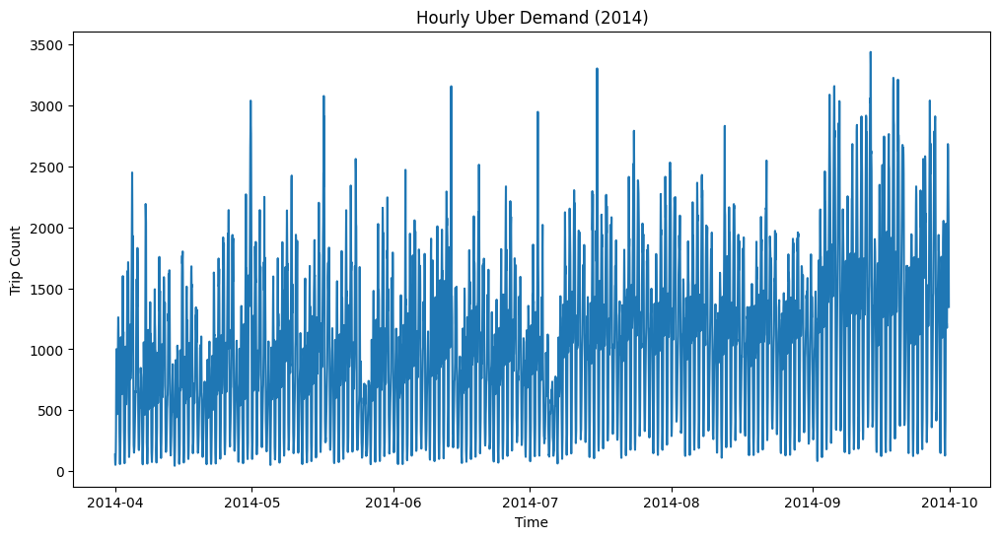

In [28]:
# Plot demand trends
plt.figure(figsize=(12, 6))
sns.lineplot(x=uber_time_series['datetime'], y=uber_time_series['trip_count'])
plt.title('Hourly Uber Demand (2014)')
plt.xlabel('Time')
plt.ylabel('Trip Count')
plt.show()

In [29]:
##----Spillting dataset into training and testing used for Time series modelling----##
train_size = int(len(uber_time_series) * 0.8)
train, test = uber_time_series["trip_count"][:train_size], uber_time_series["trip_count"][train_size:]

**5.2 Prediction using Arima Model**

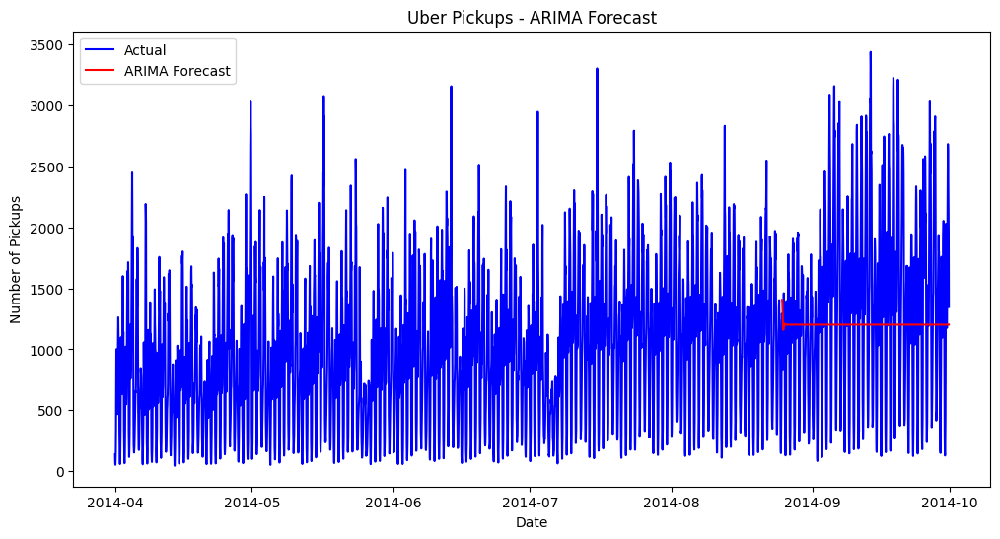

In [30]:
arima_m = ARIMA(train, order=(5,1,0))
model_fit = arima_m.fit()

forecast = model_fit.forecast(steps=len(test))

forecast_index = uber_time_series["datetime"][train_size:train_size + len(forecast)]

plt.figure(figsize=(12, 6))
plt.plot(uber_time_series["datetime"], uber_time_series["trip_count"], label="Actual", color="blue")
plt.plot(forecast_index, forecast, label="ARIMA Forecast", color="red")
plt.xlabel("Date")
plt.ylabel("Number of Pickups")
plt.title("Uber Pickups - ARIMA Forecast")
plt.legend()
plt.show()



In [31]:
evaluate_model(test, forecast, "ARIMA")

ARIMA Evaluation:
MAE: 623.88
MSE: 597843.26
RMSE: 773.20
MAPE: 91.84%



**5.2 Prediction using Sarima Model**

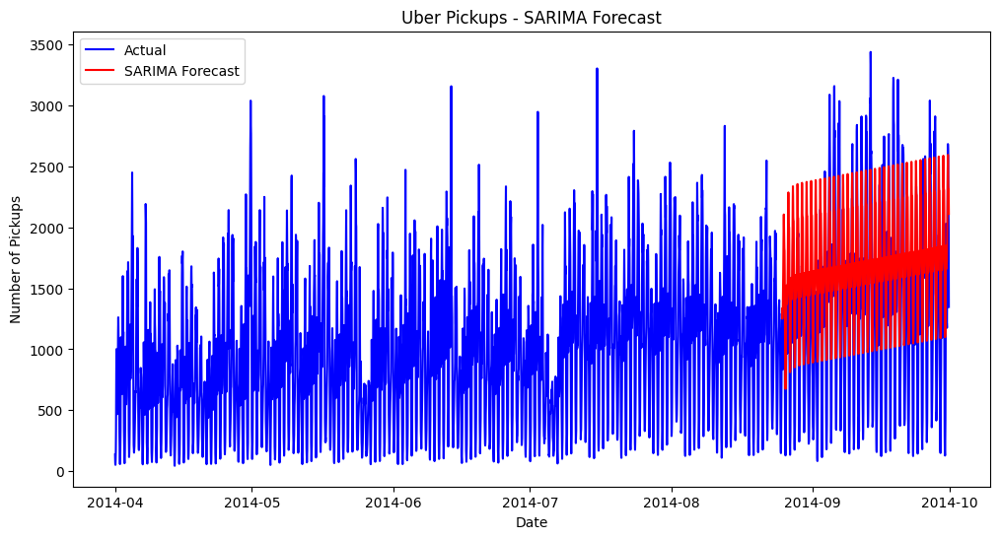

In [32]:
sarima_m = SARIMAX(train, order=(1,1,1), seasonal_order=(1,1,1,24))
sarima_fit = sarima_m.fit()

forecast = sarima_fit.get_forecast(steps=len(test)).predicted_mean

forecast_index = uber_time_series["datetime"][train_size:train_size + len(forecast)]

# Plot results
plt.figure(figsize=(12, 6))
plt.plot(uber_time_series["datetime"], uber_time_series["trip_count"], label="Actual", color="blue")
plt.plot(forecast_index, forecast, label="SARIMA Forecast", color="red")
plt.xlabel("Date")
plt.ylabel("Number of Pickups")
plt.title("Uber Pickups - SARIMA Forecast")
plt.legend()
plt.show()



In [33]:
evaluate_model(test, forecast, "SARIMA")

SARIMA Evaluation:
MAE: 474.58
MSE: 312986.78
RMSE: 559.45
MAPE: 81.67%



# **6. Machine Learning Models**

**6.1 Prediction using XGBoost Model**

In [34]:
uber_time_series["datetime"] = pd.to_datetime(uber_time_series["datetime"])

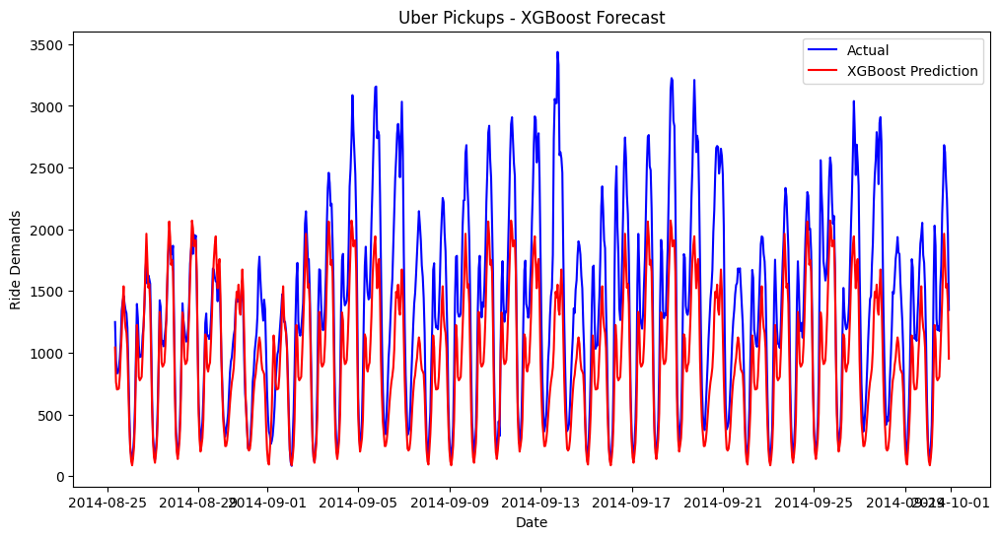

In [35]:

# Feature Engineering
uber_time_series['Hour'] = uber_time_series['datetime'].dt.hour
uber_time_series['Day_of_Week'] = uber_time_series['datetime'].dt.weekday
uber_time_series['Date'] = uber_time_series['datetime'].dt.date  # Preserve the date

# Set datetime as index for sequential modeling
uber_time_series.set_index("datetime", inplace=True)


# Train-Test Split
train_size = int(len(uber_time_series) * 0.8)

# Train-Test Split (Preserve Order)
X_train, X_test = uber_time_series[['Hour', 'Day_of_Week']][:train_size], uber_time_series[['Hour', 'Day_of_Week']][train_size:]
y_train, y_test = uber_time_series['trip_count'][:train_size], uber_time_series['trip_count'][train_size:]

xgb = XGBRegressor(n_estimators=100, learning_rate=0.1).fit(X_train, y_train)

y_pred = xgb.predict(X_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue")
plt.plot(y_test.index, y_pred, label="XGBoost Prediction", color="red")
plt.xlabel("Date")
plt.ylabel("Ride Demands")
plt.title("Uber Pickups - XGBoost Forecast")
plt.legend()
plt.show()



In [36]:
evaluate_model(y_test, y_pred, "XGBoost")

XGBoost Evaluation:
MAE: 429.28
MSE: 296126.57
RMSE: 544.18
MAPE: 30.76%



**6.2 Prediction using Random Forest Model**

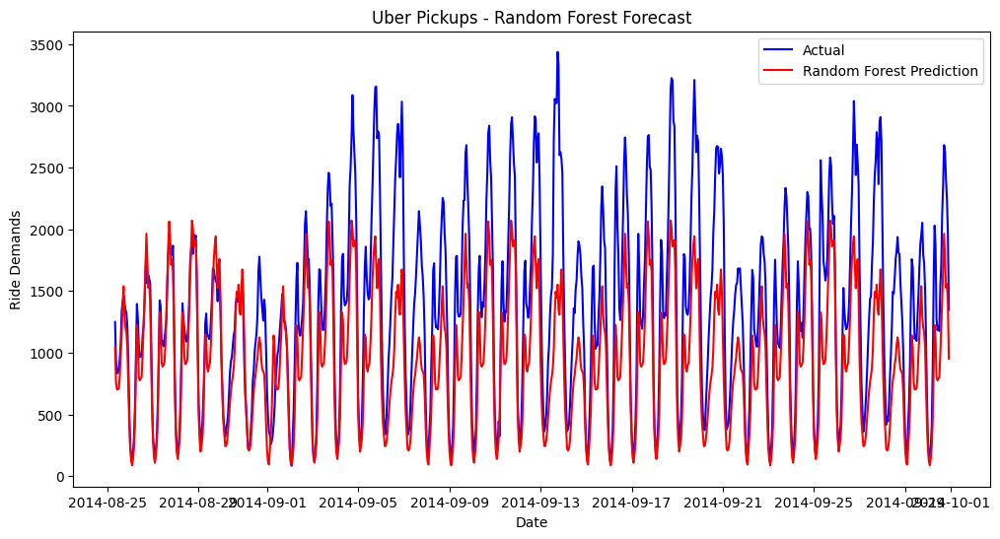

In [37]:
# Feature Engineering
#uber_time_series['Hour'] = uber_time_series['datetime'].dt.hour
#uber_time_series['Day_of_Week'] = uber_time_series['datetime'].dt.weekday
#uber_time_series['Date'] = uber_time_series['datetime'].dt.date  # Preserve the date

# Set datetime as index for sequential modeling
#uber_time_series.set_index("datetime", inplace=True)


# Train-Test Split
#train_size = int(len(uber_time_series) * 0.8)

# Train-Test Split (Preserve Order)
#X_train, X_test = uber_time_series[['Hour', 'Day_of_Week']][:train_size], uber_time_series[['Hour', 'Day_of_Week']][train_size:]
#y_train, y_test = uber_time_series['trip_count'][:train_size], uber_time_series['trip_count'][train_size:]


rf = RandomForestRegressor(n_estimators=100).fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="Actual", color="blue")
plt.plot(y_test.index, y_pred, label="Random Forest Prediction", color="red")
plt.xlabel("Date")
plt.ylabel("Ride Demands")
plt.title("Uber Pickups - Random Forest Forecast")
plt.legend()
plt.show()



In [38]:
evaluate_model(y_test, y_pred_rf, "Random Forest")

Random Forest Evaluation:
MAE: 429.24
MSE: 295734.17
RMSE: 543.81
MAPE: 30.76%



**6.3 Prediction using LSTM Model**

<ipython-input-40-c65a3565916b>:14: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



108/108 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.0517 - val_loss: 0.0608
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0267 - val_loss: 0.0248
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0132 - val_loss: 0.0120
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0092 - val_loss: 0.0120
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0089 - val_loss: 0.0101
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - val_loss: 0.0116
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - val_loss: 0.0114
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - val_loss: 0.0081
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - val_loss: 0.0079
Epoch 10/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - val_loss: 0.0086
Epoch 11/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - val_loss: 0.0082
Epoch 12/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/ste

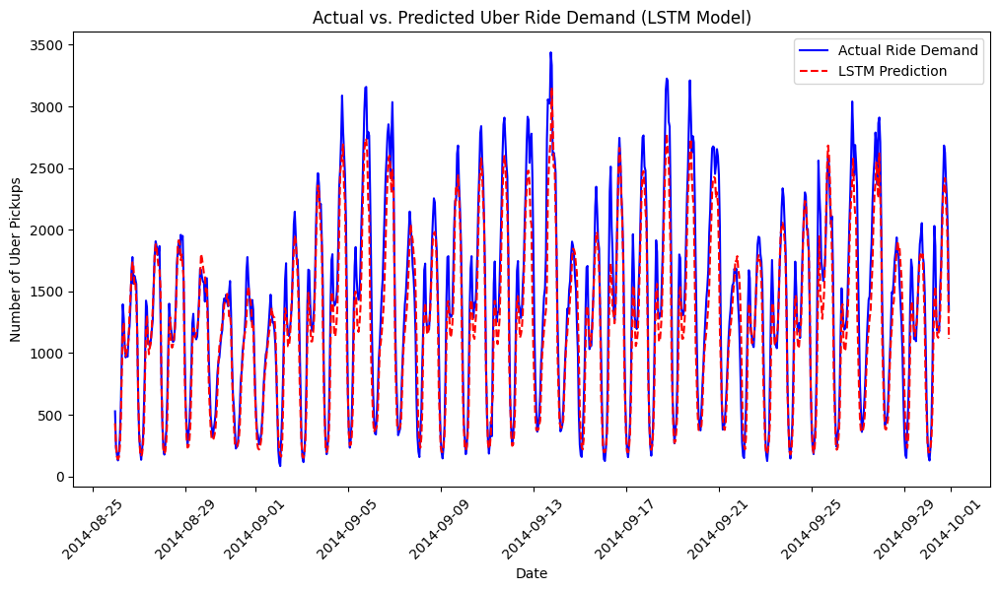

Model saved successfully!


['scaler.pkl']

In [40]:
# Initialize MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Normalize the `trip_count` column
#uber_time_series['trip_count_scaled'] = scaler.fit_transform(uber_data[['trip_count']])

uber_time_series["trip_count_scaled"] = scaler.fit_transform(uber_time_series["trip_count"].values.reshape(-1,1))
# Prepare LSTM Data (Using Scaled Values)
X_lstm, y_lstm = [], []
sequence_length = 72  # Using last 72 hours

for i in range(len(uber_time_series) - sequence_length):
    X_lstm.append(uber_time_series['trip_count_scaled'][i:i+sequence_length])
    y_lstm.append(uber_time_series['trip_count_scaled'][i+sequence_length])

# Convert to numpy arrays
X_lstm, y_lstm = np.array(X_lstm), np.array(y_lstm)

# Reshape input for LSTM [samples, time steps, features]
X_lstm = np.expand_dims(X_lstm, axis=2)

# Split Data into Training & Testing Sets
train_size = int(len(X_lstm) * 0.8)
X_train, X_test = X_lstm[:train_size], X_lstm[train_size:]
y_train, y_test = y_lstm[:train_size], y_lstm[train_size:]

# Define LSTM Model
model_lstm = Sequential([
    LSTM(50, activation="relu", return_sequences=True, input_shape=(sequence_length, 1)),
    Dropout(0.2),
    LSTM(50, activation="relu"),
    Dropout(0.2),
    Dense(25, activation="relu"),
    Dense(1)
])


# Compile Model
model_lstm.compile(optimizer='adam', loss='mse')

# Train LSTM Model
history = model_lstm.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=1)

y_pred = model_lstm.predict(X_test)

y_pred_rescaled = scaler.inverse_transform(y_pred.reshape(-1, 1))
y_test_rescaled = scaler.inverse_transform(y_test.reshape(-1, 1))

# Plot Actual vs. Predicted Ride Demand
test_index = uber_time_series.index[train_size + sequence_length:]  # Ensure proper alignment with datetime index

plt.figure(figsize=(12, 6))
plt.plot(test_index, y_test_rescaled, label="Actual Ride Demand", color="blue")
plt.plot(test_index, y_pred_rescaled, label="LSTM Prediction", color="red", linestyle="dashed")

plt.xlabel("Date")
plt.ylabel("Number of Uber Pickups")
plt.title("Actual vs. Predicted Uber Ride Demand (LSTM Model)")
plt.legend()
plt.xticks(rotation=45)
plt.show()

# Save the trained LSTM model
model_lstm.save("lstm_trip_count_model.h5")
print("Model saved successfully!")

# Save the scaler to a file
joblib.dump(scaler, "scaler.pkl")

In [42]:
evaluate_model(y_test_rescaled, y_pred_rescaled, "LSTM")

LSTM Evaluation:
MAE: 179.31
MSE: 58542.56
RMSE: 241.96
MAPE: 15.61%



# **7. Prediction of Ride demands for a specific date and time using our trained LSTM Model**

In [66]:
# Load the trained LSTM model with correct loss function
model_lstm = load_model("lstm_trip_count_model.h5", custom_objects={"mse": tensorflow.keras.losses.MeanSquaredError()})


In [67]:
# Load the scaler
scaler = joblib.load("scaler.pkl")

In [68]:

# Define the target date & time
future_datetime = datetime.datetime(2025, 2, 21, 17, 0)  # February 21, 2025, at 17:00

# Extract the necessary features
future_hour = future_datetime.hour  # Extract hour (17)
future_day_of_week = future_datetime.weekday()  # 0=Monday, ..., 6=Sunday

# Print extracted features
print(f"Predicting for Date: {future_datetime.strftime('%Y-%m-%d %H:%M')}")
print(f"Hour: {future_hour}, Day of Week: {future_day_of_week}")

Predicting for Date: 2025-02-21 17:00
Hour: 17, Day of Week: 4


In [69]:
# Extract only past 72 ride demand values
past_72_hours = uber_time_series["trip_count_scaled"].values[-72:]

# Extract time-based features
future_hour = 17  # Example: 5 PM
future_day_of_week = 4  # Example: Friday

# Stack all features into correct shape
future_input = np.hstack((past_72_hours.reshape(-1, 1), np.tile([future_hour, future_day_of_week], (72, 1))))  # Shape (72, 3)

# Reshape for LSTM input
future_input = future_input.reshape(1, 72, 3)  #(batch_size, time_steps, features)

print(f"Future Input Shape: {future_input.shape}")  


Future Input Shape: (1, 72, 3)


In [70]:
# Extract only past 72 ride demand values
past_72_hours = uber_time_series["trip_count_scaled"].values[-72:]  # Ensure 72 values

# Reshape to match LSTM input expectations
future_input = past_72_hours.reshape(1, 72, 1)  # (batch_size, time_steps, features)

# Predict scaled ride demand
predicted_scaled_demand = model_lstm.predict(future_input)

# Convert back to actual trip count
predicted_demand = scaler.inverse_transform(predicted_scaled_demand.reshape(-1, 1))[0][0]

print(f"Predicted Uber Ride Demand: {int(predicted_demand)} rides")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
Predicted Uber Ride Demand: 623 rides
